# Application Question

The demo data set for this part is the Wesenheit index of the OGLE-III fundamental-mode and first overtone classical Cepheids. 

These stars are awesome because you can use them to measure distances. Here's a nice [youtube video](https://www.youtube.com/watch?v=iyisAjHdhas) on these stars.

You'll try to estimate their period-luminosity relationship. 

The Wesenheit index is defined as `W = I - 1.55(V - I)`, and its main advantage over using simply the I or V photometry is that it is insensitive to extinction. It is denoted by 'W' among the data columns. 

Other columns are 'name', the identifier of the star; 'RA0' (in decimal hours) and 'Decl0' (in decimal degrees), celestial coordinates; 'Mode', the mode of the Cepheid ('F' indicates fundamental-mode, '1' indicates first overtone star); 'Cloud', indicating which Magellanic Cloud the star belongs to; 'logP1', the base-10 logarithm of the period in days; 'VI', the colour V-I.

We split the data into LMC and SMC, and then again by mode F and 1 (for you) below:

In [1]:
# read in the csv data file using Pandas
import pandas as pd
cep = pd.read_csv("Cepheids.csv")
print(cep.columns)

Index(['name', 'RA0', 'Decl0', 'Mode', 'Cloud', 'W', 'logP1', 'VI'], dtype='object')


In [2]:
cep

,name,RA0,Decl0,Mode,Cloud,W,logP1,VI
0,OGLE-LMC-CEP-0002,4.529733,-69.819330,F,LMC,14.52500,0.493893,0.740
1,OGLE-LMC-CEP-0005,4.592089,-69.734970,F,LMC,13.49540,0.749122,0.752
2,OGLE-LMC-CEP-0012,4.630203,-67.214420,F,LMC,14.54210,0.424912,0.598
3,OGLE-LMC-CEP-0016,4.642367,-67.646310,F,LMC,12.03300,1.021456,1.080
4,OGLE-LMC-CEP-0017,4.649119,-69.688390,F,LMC,14.34215,0.565524,0.647
...,...,...,...,...,...,...,...,...
7264,OGLE-SMC-CEP-4622,1.404808,-73.269361,1,SMC,15.94460,0.141140,0.648
7265,OGLE-SMC-CEP-4624,1.406767,-74.192639,1,SMC,15.29565,0.102449,0.577
7266,OGLE-SMC-CEP-4625,1.407181,-72.936056,1,SMC,15.33725,0.074740,0.485
7267,OGLE-SMC-CEP-4627,1.413575,-72.599167,1,SMC,14.06670,0.501477,0.686


In [3]:
#select Cepheids belonging to the LMC and SMC clouds with F and 1 modes
lmcf = cep[(cep['Cloud'] == 'LMC') & (cep['Mode'] == 'F')]
smcf = cep[(cep['Cloud'] == 'SMC') & (cep['Mode'] == 'F')]

lmco = cep[(cep['Cloud'] == 'LMC') & (cep['Mode'] == '1')]
smco = cep[(cep['Cloud'] == 'SMC') & (cep['Mode'] == '1')]

## Part 1: plot the `W` on the y-axis vs `log(P1)` on x.

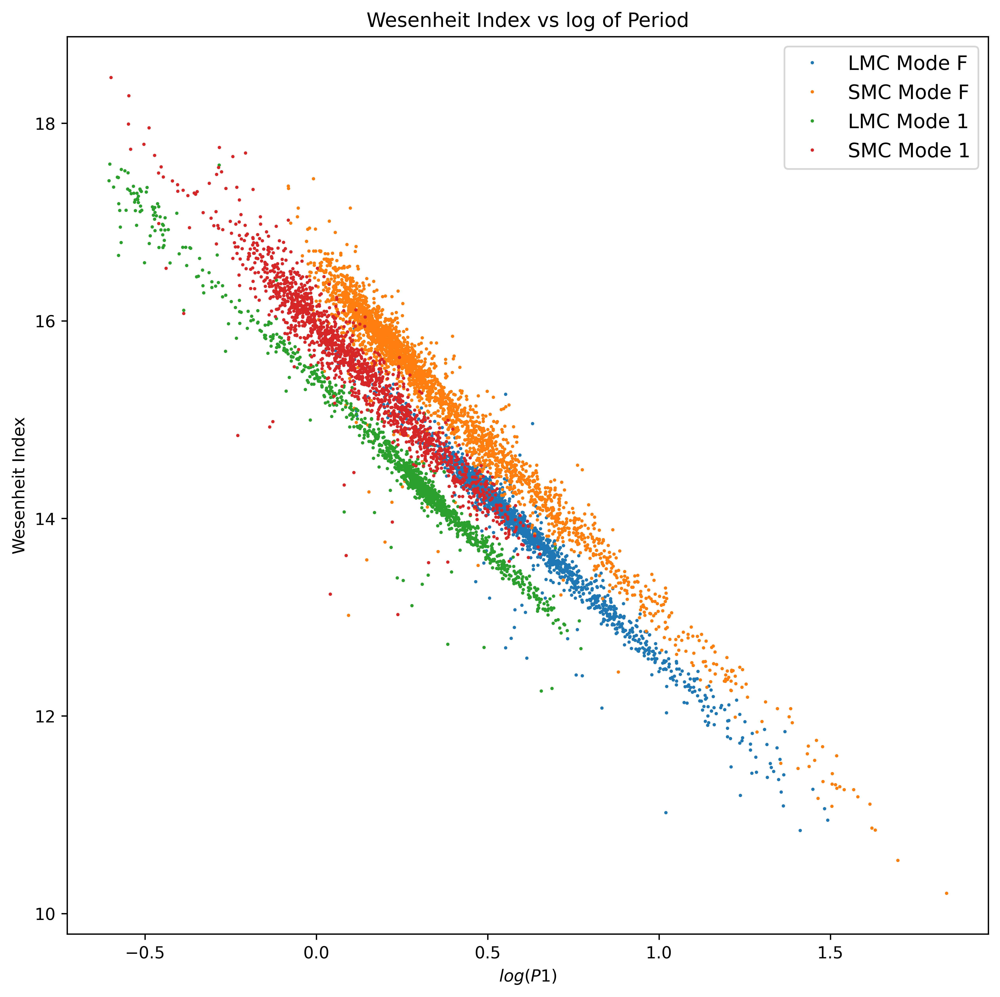

In [4]:
# YOUR CODE HERE
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10),dpi=600)
plt.title("Wesenheit Index vs log of Period")
plt.plot(lmcf['logP1'],lmcf['W'],'o',markersize=1,label="LMC Mode F")
plt.plot(smcf['logP1'],smcf['W'],'o',markersize=1,label="SMC Mode F")
plt.plot(lmco['logP1'],lmco['W'],'o',markersize=1,label="LMC Mode 1")
plt.plot(smco['logP1'],smco['W'],'o',markersize=1,label="SMC Mode 1")
plt.xlabel("$log(P1)$")
plt.ylabel("Wesenheit Index")
plt.legend(fontsize='large')

In [5]:
# Subplots
fig, ax = plt.subplots(2, 2, figsize=(20,20),dpi=600)

ax[0,0].plot(lmcf['logP1'],lmcf['W'],'.',ms=2,label="LMC Mode F")
ax[0,0].legend(fontsize='xx-large')
ax[0,0].set_xlabel("$log$(P1)")
ax[0,0].set_ylabel("Wesenheit Index")

ax[0,1].plot(lmco['logP1'],lmco['W'],'g.',ms=2,label="LMC Mode 1")
ax[0,1].legend(fontsize='xx-large')
ax[0,1].set_xlabel("$log$(P1)")
ax[0,1].set_ylabel("Wesenheit Index")

ax[1,0].plot(smcf['logP1'],smcf['W'],'.',c='orange',ms=2,label="SMC Mode F")
ax[1,0].legend(fontsize='xx-large')
ax[1,0].set_xlabel("$log$(P1)")
ax[1,0].set_ylabel("Wesenheit Index")

ax[1,1].plot(smco['logP1'],smco['W'],'r.',ms=2,label="SMC Mode 1")
ax[1,1].legend(fontsize='xx-large')
ax[1,1].set_xlabel("$log$(P1)")
ax[1,1].set_ylabel("Wesenheit Index")

Text(0, 0.5, 'Wesenheit Index')

## Part 2: Fit or estimate straight lines to each of the four samples
Note: You can use any fitting function/algorithm you like (i.e. statsmodels, astropy, scipy, numpy, etc..).

In [6]:
# YOUR CODE HERE
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit as cf

x1 = np.array(lmcf['logP1'])
x2 = np.array(lmco['logP1'])
x3 = np.array(smcf['logP1'])
x4 = np.array(smco['logP1'])
y1 = np.array(lmcf['W'])
y2 = np.array(lmco['W'])
y3 = np.array(smcf['W'])
y4 = np.array(smco['W'])
#-------------------------------------------------------------
def linear1(x1,a,b):
  return a*x1 + b
constants1 = cf(linear1,x1,y1)
a_fit1 = constants1[0][0]
b_fit1 = constants1[0][1]

fit1 = []
for i in x1:
  fit1.append(linear1(i,a_fit1,b_fit1))

fig, ax = plt.subplots(2, 2, figsize=(20,20),dpi=600)

ax[0,0].plot(x1,y1,'.',ms=1.5,label="LMC Mode F")
ax[0,0].plot(x1,fit1,c='k',lw=1,label="Fit")
ax[0,0].legend(fontsize='xx-large')
ax[0,0].set_xlabel("$log$(P1)")
ax[0,0].set_ylabel("Wesenheit Index")
#--------------------------------------------------------------
def linear2(x2,a,b):
  return a*x2 + b
constants2 = cf(linear2,x2,y2)
a_fit2 = constants2[0][0]
b_fit2 = constants2[0][1]

fit2 = []
for i in x2:
  fit2.append(linear2(i,a_fit2,b_fit2))

ax[0,1].plot(x2,y2,'.',c='g',ms=1.5,label="LMC Mode 1")
ax[0,1].plot(x2,fit2,c='k',lw=1,label="Fit")
ax[0,1].legend(fontsize='xx-large')
ax[0,1].set_xlabel("$log$(P1)")
ax[0,1].set_ylabel("Wesenheit Index")
#--------------------------------------------------------------
def linear3(x3,a,b):
  return a*x3 + b
constants3 = cf(linear3,x3,y3)
a_fit3 = constants3[0][0]
b_fit3 = constants3[0][1]

fit3 = []
for i in x3:
  fit3.append(linear3(i,a_fit3,b_fit3))

ax[1,0].plot(x3,y3,'.',c='orange',ms=1.5,label="SMC Mode F")
ax[1,0].plot(x3,fit3,c='k',lw=1,label="Fit")
ax[1,0].legend(fontsize='xx-large')
ax[1,0].set_xlabel("$log$(P1)")
ax[1,0].set_ylabel("Wesenheit Index")
#---------------------------------------------------------------
def linear4(x4,a,b):
  return a*x4 + b
constants4 = cf(linear4,x4,y4)
a_fit4 = constants4[0][0]
b_fit4 = constants4[0][1]

fit4 = []
for i in x4:
  fit4.append(linear4(i,a_fit4,b_fit4))

ax[1,1].plot(x4,y4,'.',c='r',ms=1.5,label="SMC Mode 1")
ax[1,1].plot(x4,fit4,c='k',lw=1,label="Fit")
ax[1,1].legend(fontsize='xx-large')
ax[1,1].set_xlabel("$log$(P1)")
ax[1,1].set_ylabel("Wesenheit Index")

Text(0, 0.5, 'Wesenheit Index')

## Part 3: Compute the residuals of each sample to its respective line.
Do these residuals look like a normal distribution? If not, speculate on why (WATCH THE YOUTUBE VIDEO!)

In [7]:
# YOUR CODE HERE
from scipy import stats

residual1 = y1 - fit1
ndtest1 = stats.anderson(residual1,dist='norm')

residual2 = y2 - fit2
ndtest2 = stats.anderson(residual2,dist='norm')

residual3 = y3 - fit3
ndtest3 = stats.anderson(residual3,dist='norm')

residual4 = y4 - fit4
ndtest4 = stats.anderson(residual4,dist='norm')

print(ndtest1)
print(ndtest2)
print(ndtest3)
print(ndtest4)


AndersonResult(statistic=98.2951296067697, critical_values=array([0.575, 0.655, 0.785, 0.916, 1.09 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
AndersonResult(statistic=76.14972072991509, critical_values=array([0.574, 0.654, 0.784, 0.915, 1.088]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
AndersonResult(statistic=68.50256927487726, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.09 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
AndersonResult(statistic=37.20366043796889, critical_values=array([0.575, 0.654, 0.785, 0.916, 1.089]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))


**As the statistic value is far greater than its respective critical value hence we reject null hypothesis that data follows normal distribution.**

In [8]:
fig, ax = plt.subplots(2, 2, figsize=(20,20),dpi=600)


ax[0,0].hist(residual1)
ax[0,0].set_title('LMC Mode F Residuals')
ax[0,0].set_xlabel('Deviation from fit')
ax[0,0].set_ylabel('Number of samples')

ax[0,1].hist(residual2)
ax[0,1].set_title('LMC Mode 1 Residuals')
ax[0,1].set_xlabel('Deviation from fit')
ax[0,1].set_ylabel('Number of samples')

ax[1,0].hist(residual3)
ax[1,0].set_title('SMC Mode F Residuals')
ax[1,0].set_xlabel('Deviation from fit')
ax[1,0].set_ylabel('Number of samples')

ax[1,1].hist(residual4)
ax[1,1].set_title('SMC Mode 1 Residuals')
ax[1,1].set_xlabel('Deviation from fit')
ax[1,1].set_ylabel('Number of samples')

plt.suptitle("Residual Histograms",fontsize='xx-large')

Text(0.5, 0.98, 'Residual Histograms')

## Part 4: Scatter plot of the residuals as RA (x-axis) vs Dec (y-axis) color-coded by whether they are positive or negative.
What do you see?

In [9]:
# YOUR CODE HERE

fig, ax = plt.subplots(2, 2, figsize=(20,20),dpi=600)

ax[0,0].scatter(lmcf['RA0'],lmcf['Decl0'],s=3,c=np.sign(residual1),cmap="bwr")
ax[0,0].set_xlabel("Right Ascension in Hours")
ax[0,0].set_ylabel("Declination in decimal degrees")


ax[0,1].scatter(lmco['RA0'],lmco['Decl0'],s=3,c=np.sign(residual2),cmap="bwr")
ax[0,1].set_xlabel("Right Ascension in Hours")
ax[0,1].set_ylabel("Declination in decimal degrees")

ax[1,0].scatter(smcf['RA0'],smcf['Decl0'],s=3,c=np.sign(residual3),cmap="bwr")
ax[1,0].set_xlabel("Right Ascension in Hours")
ax[1,0].set_ylabel("Declination in decimal degrees")

ax[1,1].scatter(smco['RA0'],smco['Decl0'],s=3,c=np.sign(residual4),cmap="bwr")
ax[1,1].set_xlabel("Right Ascension in Hours")
ax[1,1].set_ylabel("Declination in decimal degrees")

plt.suptitle("Residuals colour coded by positive or negative - Blue: Negative - Red: Positive",fontsize='xx-large')

Text(0.5, 0.98, 'Residuals colour coded by positive or negative - Blue: Negative - Red: Positive')

The blue dots are negative residuals and red dots are positive residuals. It's noticeable that the residuals are distributed quite evenly in LMC Mode F and Mode 1. But in LMC Mode F plot, the distribution of blue dots is concentrated in the central region. So the fit is overestimated for all those stars i.e the Wesenheit index is less than what we have expected. This probably points towards the light being absorbed or scattered due to interstellar medium or the gases within the LMC/SMC or due to matter within our own galaxy. In SMC it's noticeable that most of the blue dots are shifted to the left side so that part of SMC must have dense gases which are affecting the light that travels through them. This has to be taken into account while determining distances to these Cepheid Variables. 

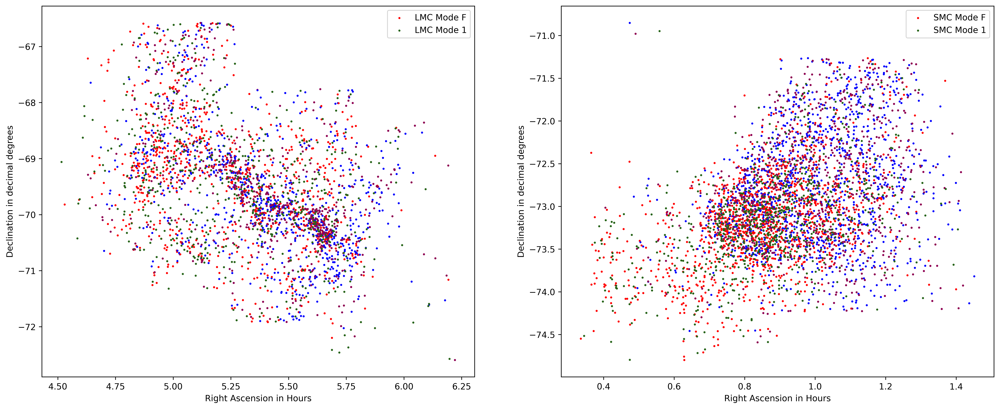

In [10]:
# Just to visualize all the Cepheid Variables in LMC and SMC in one plot.
# LMC Mode F, Mode 1 together in one plot and SMC Mode F, Mode 1 together in one plot.
# Using different color maps for Mode F and Mode 1
fig, ax = plt.subplots(1, 2, figsize=(20,8),dpi=600)

ax[0].scatter(lmcf['RA0'],lmcf['Decl0'],s=2,c=np.sign(residual1),cmap="bwr",label='LMC Mode F')
ax[0].scatter(lmco['RA0'],lmco['Decl0'],s=2,c=np.sign(residual2),cmap="PiYG",label='LMC Mode 1')
ax[0].set_xlabel("Right Ascension in Hours")
ax[0].set_ylabel("Declination in decimal degrees")
ax[0].legend()

ax[1].scatter(smcf['RA0'],smcf['Decl0'],s=2,c=np.sign(residual3),cmap="bwr",label='SMC Mode F')
ax[1].scatter(smco['RA0'],smco['Decl0'],s=2,c=np.sign(residual4),cmap="PiYG",label='SMC Mode 1')
ax[1].set_xlabel("Right Ascension in Hours")
ax[1].set_ylabel("Declination in decimal degrees")
ax[1].legend()
